In [9]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
#pd.set_option('display.max_colwidth', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
#pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 100)
#pd.set_option('display.width', 5000)  # Adjust the width as needed
#pd.options.display.colheader_justify = 'center' 
def custom_format(x):
    return "{:.2f}".format(x)  # Change the format as needed
pd.options.display.float_format = custom_format



In [10]:
#load
df = pd.read_csv('current_analysis/xdbc_experiments_master.csv')

display(df.head())

params = {
    'server_cpu': [7, 1, 0.2],
    'client_cpu': [7, 1, 0.2],
    'network': [6, 50, 100]
}

# Create a list of scenarios
scenarios = []

# Generate all possible combinations of parameters and create scenarios
for s_cpu in params['server_cpu']:
    for c_cpu in params['client_cpu']:
        for net in params['network']:
            scenario_name = f'server_cpu_{s_cpu}_client_cpu_{c_cpu}_network_{net}'
            scenario_filter = (df['server_cpu'] == s_cpu) & (df['client_cpu'] == c_cpu) & (df['network'] == net)
            scenarios.append((scenario_name, scenario_filter))

# Create a dictionary of scenarios
scenario_filters = {name: filter_condition for name, filter_condition in scenarios}

#preprocess
#df.drop(['date','host','run', 'system', 'table','compression','network','client_cpu','server_cpu','bufpool_size'], axis=1, inplace=True)
#df.drop(['system','date','host','run','table','bufpool_size'], axis=1, inplace=True)

,date,host,run,system,table,compression,format,network_parallelism,bufpool_size,buff_size,network,client_readmode,client_cpu,client_read_par,client_decomp_par,server_cpu,server_read_par,server_read_partitions,server_deser_par,time,datasize
0,1696042475,sr630-wn-a-25.dima.tu-berlin.de,1,csv,test_10000000,nocomp,1,1,1000,1000,100,2,7.00,1,1,1.00,1,8,1,19.36,504212519
1,1696042475,sr630-wn-a-04.dima.tu-berlin.de,1,csv,test_10000000,nocomp,1,1,1000,1000,100,2,7.00,1,1,1.00,1,1,2,19.54,504115495
2,1696042475,sr630-wn-a-07.dima.tu-berlin.de,1,csv,test_10000000,nocomp,1,1,1000,1000,100,2,7.00,1,1,1.00,1,2,1,20.26,504109427
3,1696042475,sr630-wn-a-32.dima.tu-berlin.de,1,csv,test_10000000,nocomp,1,1,1000,1000,100,2,7.00,1,1,1.00,2,1,8,20.14,504053525
4,1696042475,sr630-wn-a-03.dima.tu-berlin.de,1,csv,test_10000000,nocomp,1,1,1000,1000,100,2,7.00,1,1,1.00,1,1,1,20.07,504124673


In [8]:
column_order = ['client_cpu', 'server_cpu', 'network'] + [col for col in df.columns if col not in ['client_cpu', 'server_cpu', 'network']]
df = df[column_order]
# Group the original DataFrame by 'server_cpu', 'client_cpu', and 'network'
grouped = df.groupby(['client_cpu', 'server_cpu', 'network'])

# Find the row with the minimum 'time' value in each group
min_time_rows = grouped.apply(lambda x: x[x['time'] == x['time'].min()])
min_time_rows['agg_type'] = 'min'  # Add a column to specify 'min'

min_time_rows = min_time_rows.drop_duplicates(['server_cpu', 'client_cpu', 'network'])

# Find the row with the maximum 'time' value in each group
max_time_rows = grouped.apply(lambda x: x[x['time'] == x['time'].max()])
max_time_rows['agg_type'] = 'max'  # Add a column to specify 'max'

max_time_rows = max_time_rows.drop_duplicates(['server_cpu', 'client_cpu', 'network'])


# Combine the two DataFrames
result_df = pd.concat([min_time_rows, max_time_rows], ignore_index=True)

# Reset the index of the result dataframe
result_df = result_df.reset_index(drop=True)

result_df.sort_values(by=['client_cpu', 'server_cpu', 'network'], ascending=False, inplace=True)

result_df = result_df[(result_df['client_cpu']==1) & (result_df['server_cpu']==1) & (result_df['network']==100)]
display(result_df)


,client_cpu,server_cpu,network,date,host,run,system,table,compression,format,network_parallelism,bufpool_size,buff_size,client_readmode,client_read_par,client_decomp_par,server_read_par,server_read_partitions,server_deser_par,time,datasize,agg_type
14,1.00,1.00,100,1697366968,sr630-wn-a-31.dima.tu-berlin.de,1,postgres,test_10000000,cols,1,1,1000,1000,2,1,2,1,8,1,13.69,118969828,min
41,1.00,1.00,100,1697389978,sr630-wn-a-32.dima.tu-berlin.de,1,postgres,test_10000000,zlib,2,4,1000,10000,2,2,4,4,4,8,365.07,145910153,max


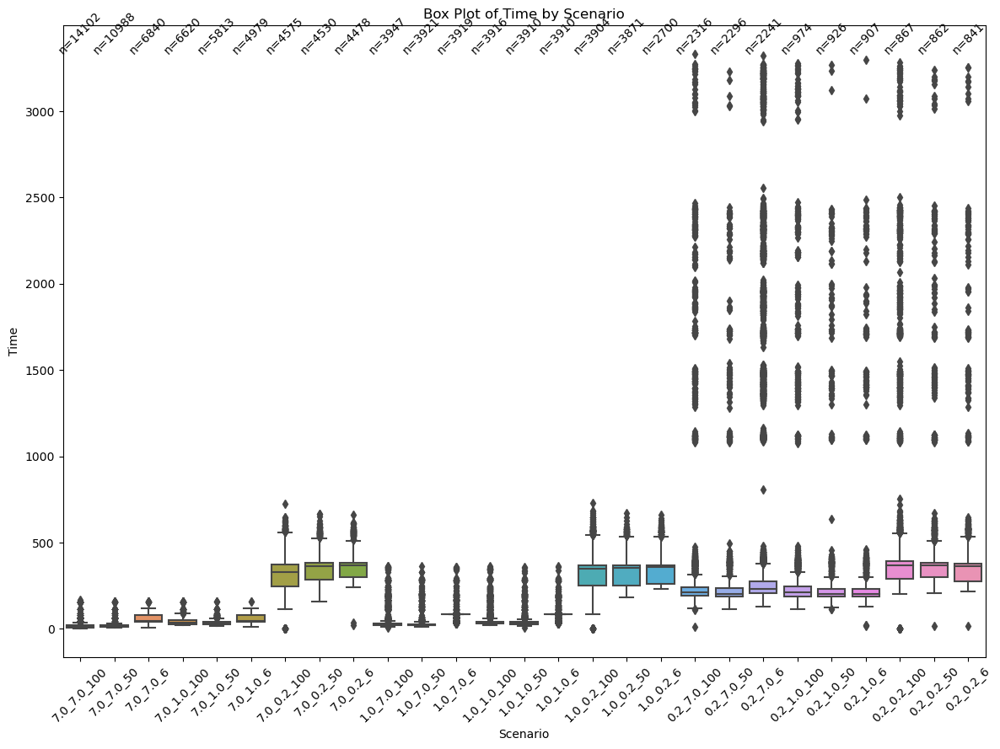

In [11]:
# Create a new column 'scenario' by combining 'server_cpu,' 'client_cpu,' and 'network'
box_df = df.copy()  # Create a copy of the original DataFrame
box_df = box_df[box_df["system"]=="csv"]
box_df['scenario'] = box_df['server_cpu'].astype(str) + '_' + box_df['client_cpu'].astype(str) + '_' + box_df['network'].astype(str)
box_df.sort_values(by=['server_cpu', 'client_cpu', 'network'], ascending=False, inplace=True)

# Create a box plot using Seaborn
plt.figure(figsize=(12, 9))
ax = sns.boxplot(x='scenario', y='time', data=box_df)

# Customize labels and title
plt.xlabel('Scenario')
plt.ylabel('Time')
plt.title('Box Plot of Time by Scenario')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Annotate the boxes with the count of values in each scenario
group_counts = box_df['scenario'].value_counts()
for i, count in enumerate(group_counts):
    ax.text(i, box_df['time'].max(), f'n={count}', ha='center', fontsize=10, color='black', rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Create a new column 'scenario' by combining 'server_cpu,' 'client_cpu,' and 'network'
box_df = df.copy()  # Create a copy of the original DataFrame
box_df['scenario'] = box_df['server_cpu'].astype(str) + '_' + box_df['client_cpu'].astype(str) + '_' + box_df['network'].astype(str)
box_df.sort_values(by=['server_cpu', 'client_cpu', 'network'], ascending=False, inplace=True)

# Create an interactive box plot using Plotly Express
fig = px.box(box_df, x='scenario', y='time', points='all', title='Interactive Box Plot of Time by Scenario')

# Customize the appearance of the plot
fig.update_xaxes(title='Scenario', tickangle=45)
fig.update_yaxes(title='Time')

# Add data point tooltips (hover text)
fig.update_traces(marker=dict(size=3), selector=dict(mode='markers+text'))
#fig.update_traces(text=box_df['time'], textposition='top center', hoverinfo='text')

# Show the interactive plot
fig.show()

In [37]:
# Create a figure for each scenario
figures = []

# Iterate over each scenario and create a separate histogram figure
for scenario_name, condition in scenario_filters.items():
    # Filter the DataFrame for the selected scenario
    histogram_df = df[condition].copy()

    # Check if there are values for the scenario
    if not histogram_df.empty:
        # Drop the 'compression' column
        histogram_df.drop(['host','system','table'], axis=1, inplace=True)
        histogram_df = pd.get_dummies(histogram_df, columns=['compression'])

        scaler = MaxAbsScaler()

        # Define columns to scale
        columns_to_scale = histogram_df.columns.difference(['time', 'datasize'])

        # Apply MinMaxScaler to selected columns
        histogram_df[columns_to_scale] = scaler.fit_transform(histogram_df[columns_to_scale])

        # Calculate the bin size (in seconds)
        bin_size = 3

        # Calculate the number of bins based on the bin size
        num_bins = int((histogram_df['time'].max() - histogram_df['time'].min()) / bin_size)

        # Create a histogram trace
        trace = go.Histogram(
            x=histogram_df['time'],
            nbinsx=num_bins,
            histnorm='percent',  # Display as percentage
            opacity=0.5,
        )

        # Create a layout for the figure
        layout = go.Layout(
            title=f'Histogram of Runtime Performance for {scenario_name}',
            xaxis_title='Runtime Performance (s)',
            yaxis_title='Percentage',
            bargap=0.01,
        )

        # Create the figure
        fig = go.Figure(data=[trace], layout=layout)

        # Add the figure to the list of figures
        figures.append(fig)

# Show each figure separately
for fig in figures:
    fig.show()

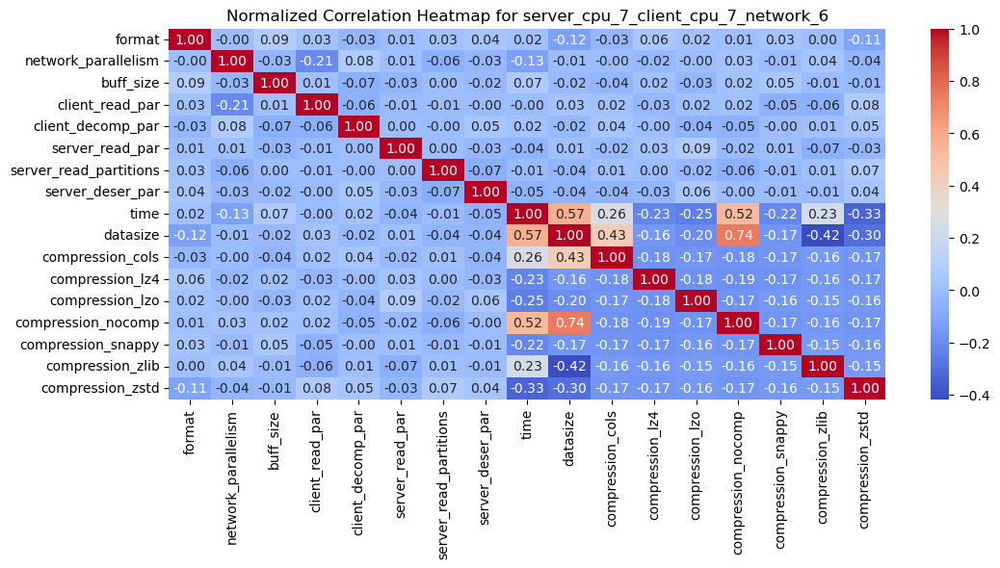

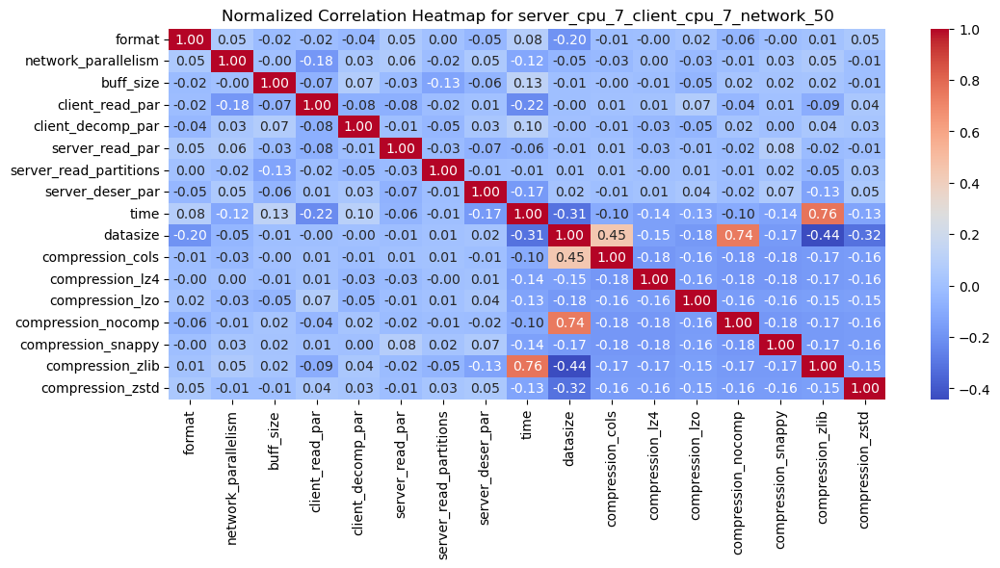

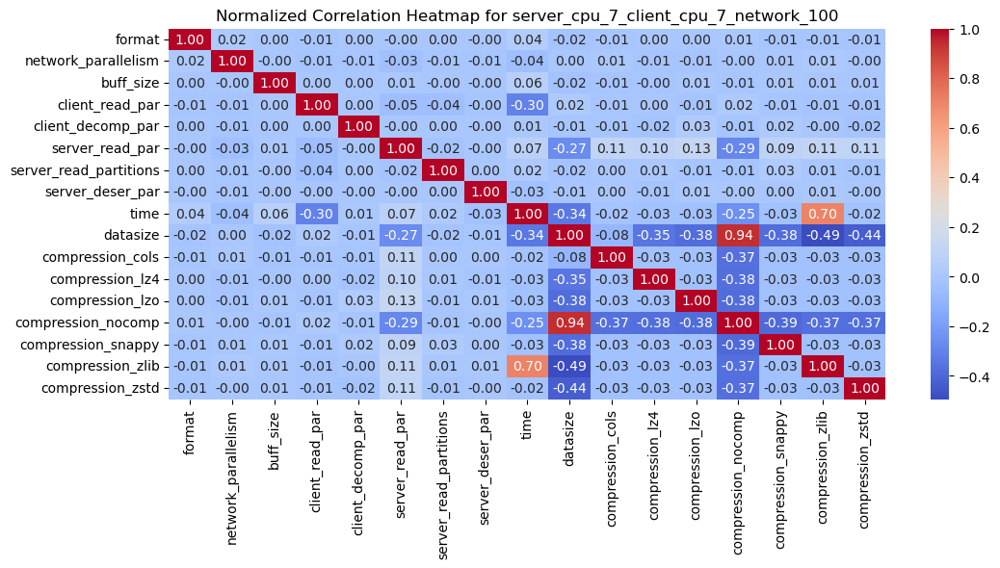

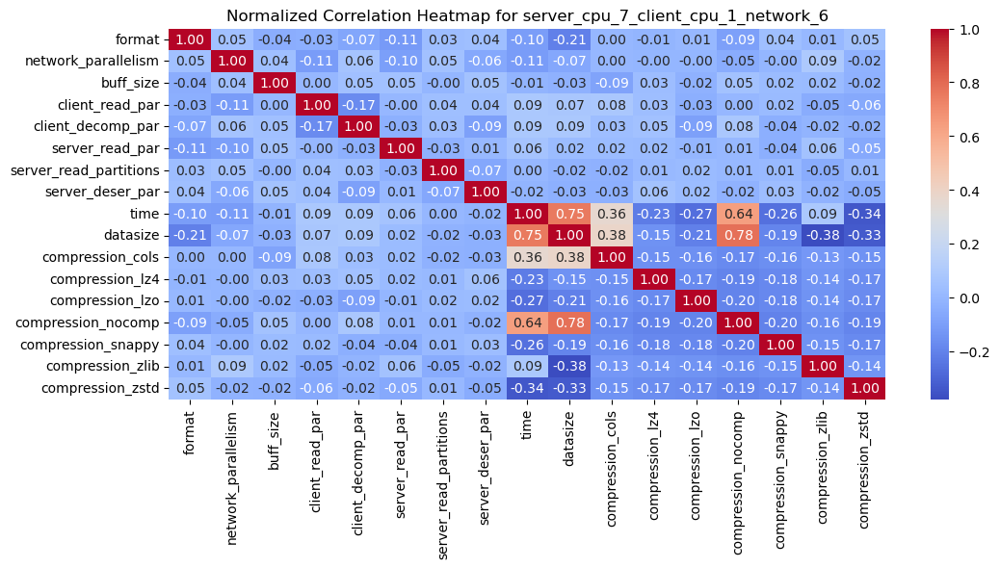

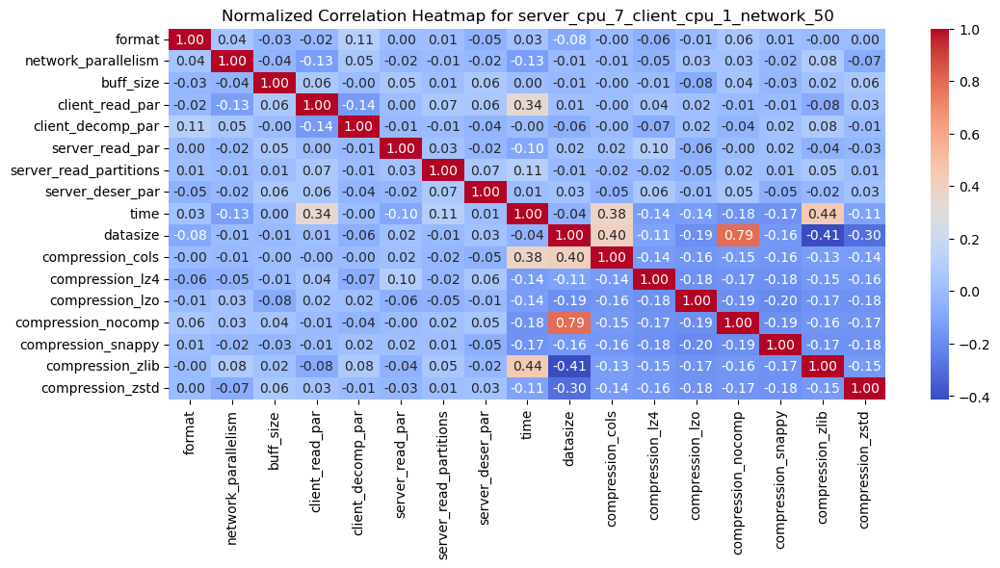

...

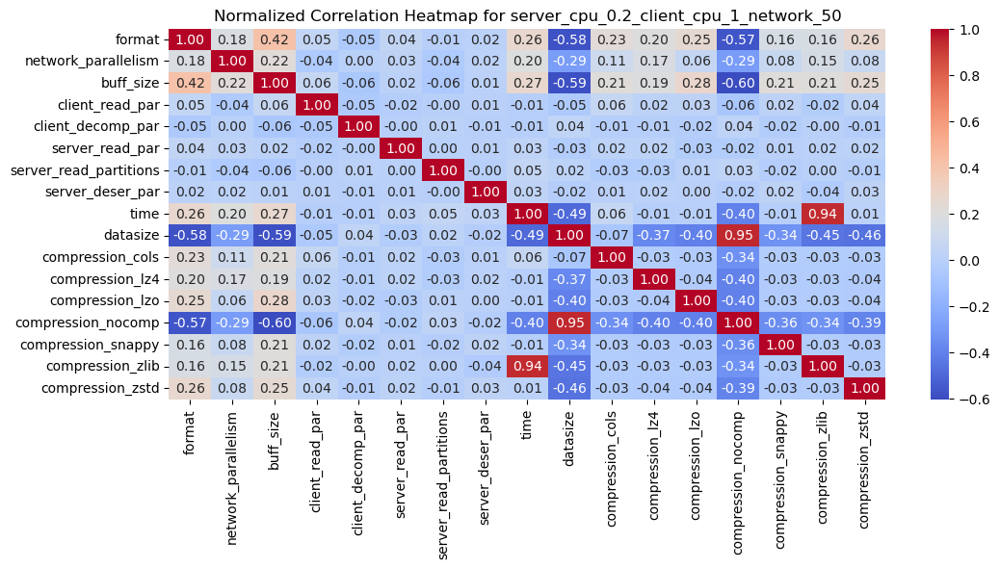

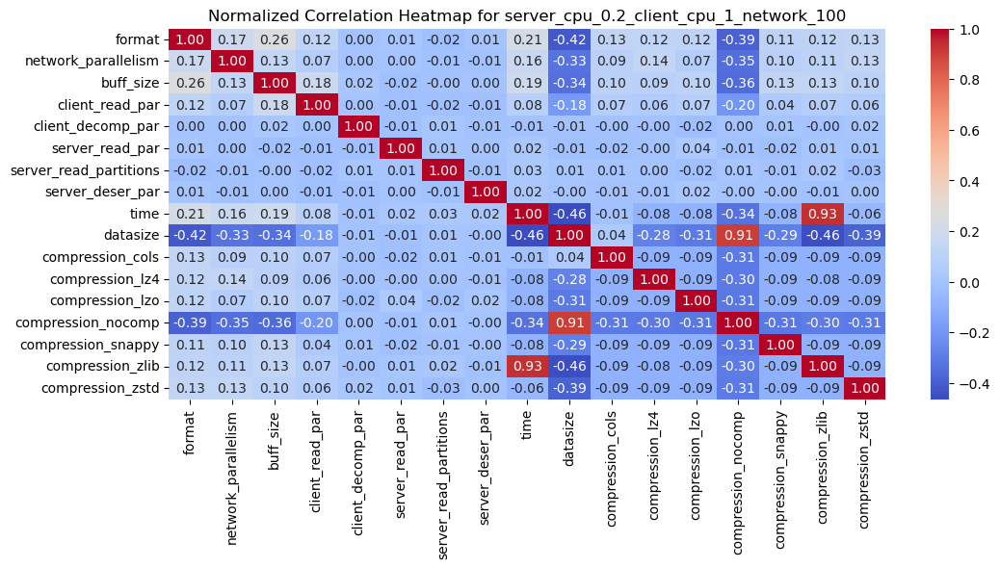

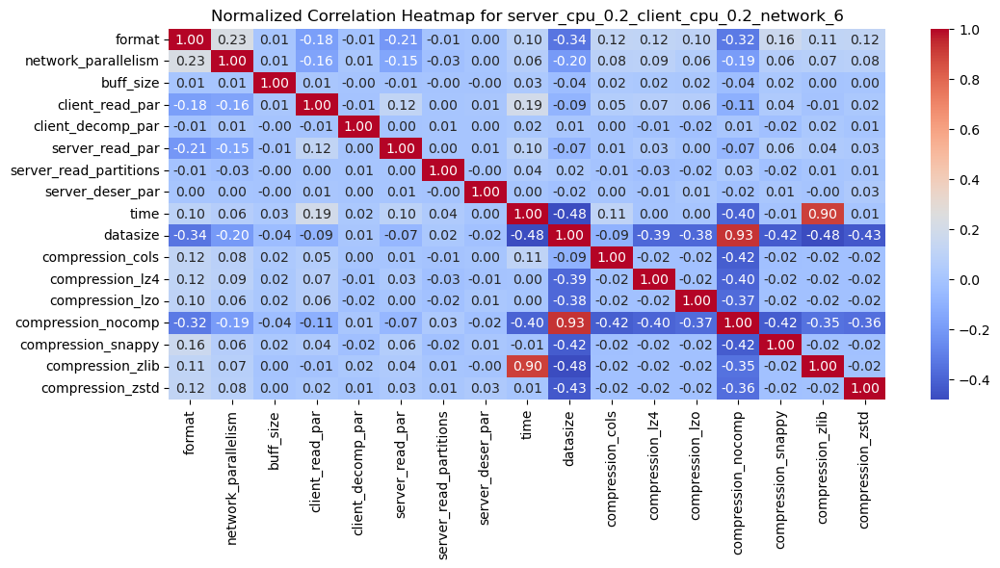

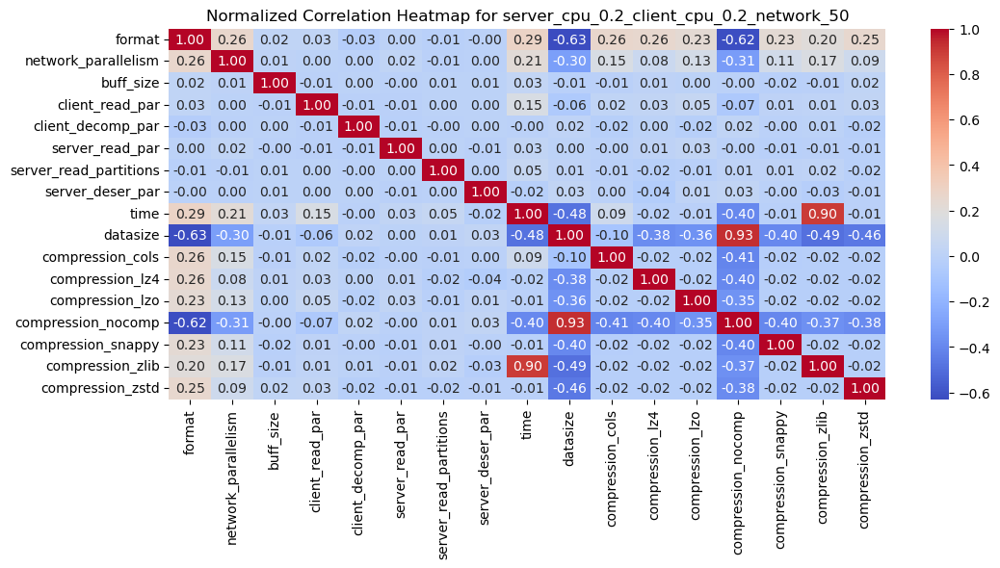

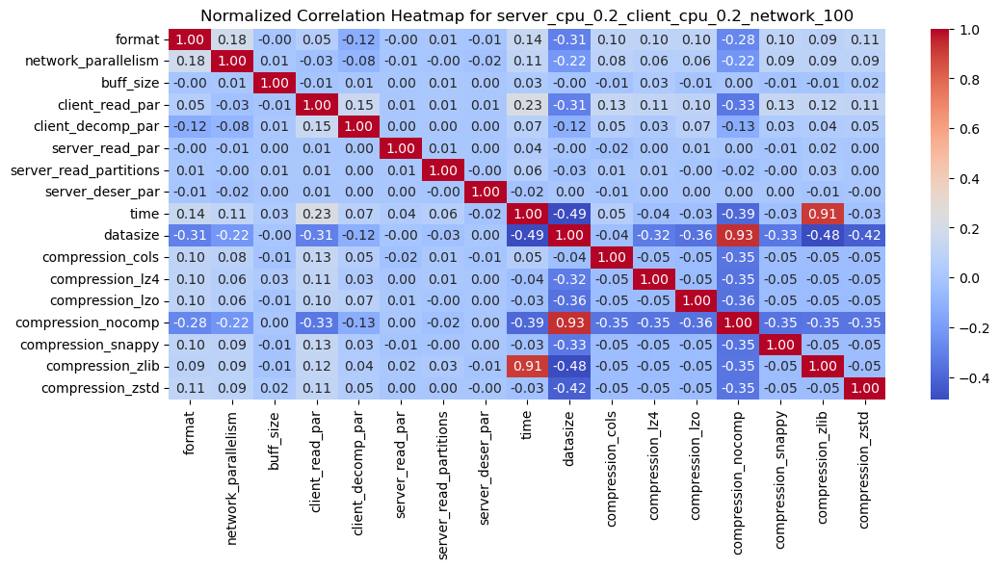

In [38]:

# Create a figure for each scenario
figures = []

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Iterate over each scenario and create a separate heatmap figure
for scenario_name, condition in scenario_filters.items():
    # Filter the DataFrame for the selected scenario
    heatmap_df = df[condition].copy()

    # Check if there are values for the scenario
    if not heatmap_df.empty:
        # Normalize the values within the scenario
        heatmap_df.drop(['host','system','table','run','date','client_readmode','bufpool_size','network','client_cpu','server_cpu'], axis=1, inplace=True)

        heatmap_df = pd.get_dummies(heatmap_df, columns=['compression'])
        columns_to_normalize = heatmap_df.columns.difference(['time', 'datasize'])
        heatmap_df[columns_to_normalize] = scaler.fit_transform(heatmap_df[columns_to_normalize])

        # Calculate correlation matrix
        corr_matrix = heatmap_df.corr(numeric_only=True)  # Specify numeric_only=True

        # Create a heatmap
        plt.figure(figsize=(12, 5))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")

        # Customize the heatmap appearance
        plt.title(f'Normalized Correlation Heatmap for {scenario_name}')
        plt.show()


In [ ]:


# Initialize MinMaxScaler
scaler = MaxAbsScaler()

# Iterate over each scenario and create a separate heatmap figure
for scenario_name, condition in scenario_filters.items():
    scatter_df = df[condition].copy()
    if not scatter_df.empty:
        
        print(f"Scatter Plots for {scenario_name}")
        scatter_df.drop(['host','system','table','run','date','client_readmode','bufpool_size','network','client_cpu','server_cpu'], axis=1, inplace=True)

        scatter_df = pd.get_dummies(scatter_df, columns=['compression'], drop_first=True)
        columns_to_normalize = scatter_df.columns.difference(['time', 'datasize'])
        scatter_df[columns_to_normalize] = scaler.fit_transform(scatter_df[columns_to_normalize])
        
        # List of variables you want to visualize
        variables_to_visualize = scatter_df.columns.difference(['time', 'datasize'])
        # Create a subplot grid based on the number of variables
        n_cols = 3  # Number of columns in the grid
        n_rows = (len(variables_to_visualize) + n_cols - 1) // n_cols  # Calculate the number of rows
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
        axes = axes.flatten()

        # Loop through each variable and create plots
        for i, variable in enumerate(variables_to_visualize):
            # Scatter plot with regression curve
            sns.scatterplot(x=variable, y='time', data=scatter_df, ax=axes[i])
            sns.regplot(x=variable, y='time', data=scatter_df, scatter=False, color='red', ax=axes[i])
            axes[i].set_title(f'Scatter Plot for {variable}')
            axes[i].set_xlabel(variable+" (normalized)")
            axes[i].set_ylabel('Time')

        # Remove empty subplots if needed
        for j in range(len(variables_to_visualize), n_cols * n_rows):
            fig.delaxes(axes[j])

        # Adjust layout and display the plots
        plt.tight_layout()
        plt.show()

In [ ]:
#selected_scenario = 'server_cpu_0.2_client_cpu_0.2_network_100'
for scenario_name, condition in scenario_filters.items():
    condition = scenario_filters[scenario_name]
    kde_df = df[condition].copy()
    if not kde_df.empty:
        print(scenario_name)
        kde_df.drop(['compression','client_cpu','server_cpu','client_readmode','network'], axis=1, inplace=True)
        columns_to_normalize = kde_df.columns.difference(['time', 'datasize'])
        kde_df[columns_to_normalize] = scaler.fit_transform(kde_df[columns_to_normalize])

        # List of variables you want to visualize
        variables_to_visualize = kde_df.columns.difference(['time', 'datasize'])

        # Create a subplot grid based on the number of variables
        n_cols = 3  # Number of columns in the grid
        n_rows = (len(variables_to_visualize) + n_cols - 1) // n_cols  # Calculate the number of rows
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
        axes = axes.flatten()

        # Loop through each variable and create kernel density plots
        for i, variable in enumerate(variables_to_visualize):
            # Kernel density plot
            sns.kdeplot(data=kde_df, x=variable, y='time', fill=True, cmap='Blues', ax=axes[i])
            axes[i].set_title(f'Kernel Density Plot for {variable}')
            axes[i].set_xlabel(variable+" (normalized)")
            axes[i].set_ylabel('Time')

        # Remove empty subplots if needed
        for j in range(len(variables_to_visualize), n_cols * n_rows):
            fig.delaxes(axes[j])

        # Adjust layout and display the plots
        plt.tight_layout()
        plt.show()

In [ ]:
start_df['config'] = (
    'date:' + df['date'].astype(str) + '|' +
    'sys:' + df['sys'].astype(str) + '|' +
    'table:' + df['table'].astype(str) + '|' +
    'scpu:' + df['scpu'].astype(str) + '|' +
    'ccpu:' + df['ccpu'].astype(str) + '|' +
    'network:' + df['network'].astype(str) + '|' +
    'comp:' + df['comp'].astype(str) + '|' +
    'format:' + df['format'].astype(str) + '|' +
    'npar:' + df['npar'].astype(str) + '|' +
    'bpsize:' + df['bpsize'].astype(str) + '|' +
    'bsize:' + df['bsize'].astype(str) + '|' +
    'sreadpar:' + df['sreadpar'].astype(str) + '|' +
    'sreadparts:' + df['sreadparts'].astype(str) + '|' +
    'sdeserpar:' + df['sdeserpar'].astype(str) + '|' +
    'creadpar:' + df['creadpar'].astype(str) + '|' +
    'cdecomppar:' + df['cdecomppar'].astype(str)
)

In [ ]:
df = start_df[['config', 'time', 'datasize']]
df = df.sort_values(by=['time', 'config'], ascending=[True, True])
df.head(20)

In [ ]:
# Calculate the IQR (Interquartile Range)
Q1 = df['time'].quantile(0.0005)
Q3 = df['time'].quantile(0.9)
IQR = Q3 - Q1
print(Q1)
print(Q3)
print(IQR)

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the DataFrame to remove outliers
filtered_df = df[(df['time'] >= lower_bound) & (df['time'] <= upper_bound)]

# Display the filtered DataFrame
print(filtered_df)